This Jupyter notebook file is written to show an improved model to examine the dynamics of a dimer of Y6. Here there are 6 excited states: 2 frenkel excitations located on one of the molecules of the dimer, 2 charge transfer states with plus charged located on one molecule of the dimer and the minus charge on the other molecule and 2 Triplet states assumed to be the triplet version of the frenkel excitations.  

In [1]:
const thz2au = 0.0001519828500716
const invcm2au = 4.55633e-6
const au2fs = 0.02418884254
const mev2invcm = 8.066
const mev2au = mev2invcm * invcm2au
const mev2J = 1.6*10^(-19)*10^(-3)
const nm2au = 18.897


18.897

In [2]:
using OrdinaryDiffEq
using DelimitedFiles
using LinearAlgebra
using Sundials
using QuantumDynamics
using MKL


┌ Warning: MKL is not available/installed.
└ @ MKL ~/.julia/packages/MKL/aHIRu/src/MKL.jl:39


In [3]:
function Y6UpconversionDimerHamiltonianWTriplet(socs::Float64, socn::Float64, Vcte::Float64, Vcth::Float64)
    """ Function used to calculate Hamiltonian used in non-adiabatic dynamics calculations 
    input float socs is the spin orbit coupling mediated transfer matrix for triplet and FE, where both are on the same site 
    input float socn is the spin orbit coupling mediated transfer matrix for triplet and FE, where the two are on different sites
    input float Vcte is the transfer matrix from triplet state to CT on one site where the hole moves to other site 
    input float Vcte is the transfer matrix from triplet state to CT on one site where the electron moves to other site 
    return complex matrix H0 Hamiltonian  
    """

    # Params from Samuele paper

    # D1 dimer dynamics - FE vs CT character over time.

    reorg = [157.0, 157.0, 480.0, 480.0, 157.0]*mev2au
    #reorg got from Table S1 from Samuelle paper. 
    #157mev comes from the exciton 
    #480ev comes from the sum of the cation and anion reorganisation energies. 
    #Obviously would be good to calculate our own values for these. 
    #These are only calculated for one molecule and not for the dimer complex. 
    #Would be good to calculate more accurate reorganisation energies. 

     cutoff = repeat([1600 * invcm2au], 5)
    #I am currently unsure where the cut-off comes from in the paper. 

    #Efe = 2046.0
    Ect(r) = (2.19 -  4.959/(r))*1000  #best fit equation for Ect
    #Equation comes from Eq. S10 of the supplementary information coverted energy into mev. 
    #epsilon taken as 2.9 and r is measured in angstroms 
    Dh = 55.7
    De = 72.0
    V = -76.0
    #Values taken from S3 table using First Dimer molecule. 
    #The values of these quantities vary significantly between the different types of dimer  
    #Dh refers to the transfer integral where FE on Y61 causes CT state with a hole on Y62 and an electron on Y61
    #De refer to the transfer integral where FE on Y61 causes a CT state with a hole on Y61 and an electron on Y62 
    #V is the transfer integral of FE from Y61 to Y62 
    #See S5 figure for image of various transfer integrals 

    Vt = -76.0
    #Coupling between two triplet states in this preliminary work assumed to be the same as singlet state 
    
    Ec = Ect(9.29)
    # r value for CT taken from the distance for the first Dimer molecule. 
    #Again the question comes as to what happens if you choose another dimer molecule out of 8 close contact dimers. 
    #I think the results will vary as the energies are different 
    #Ec is around 1.656ev (Lowest energy of all states in the system). This is the essential reason for the results below. 
    #If you look at Figure S8 I believe that for D9 and D10 we may see different behaviour as here Frenkel more stable. 
    #More importantly the driving force really does vary depending on the dimer complex used


    # Zhenghan singlet values could calculate more accurately. 
    #Suggestion I could calculate for each of the Dimers the energies individually. 

    Efe1 = 1872.0
    Efe2 = 1886.0

    # Zhenghan triplet values could calculate more accurately. 
    #Suggestion I could calculate for each of the Dimers the energies individually. 
    Et1 = 1350.0
    Et2 = 1393.0
 

#Defining the matrix used in any calculation 


    H0 = Matrix{ComplexF64}([
        Efe1 V Dh De socs socn 
        V Efe2 De Dh socn socs 
        Dh De Ec 0.0 Vcth Vcte
        De Dh 0.0 Ec Vcte Vcth 
        socs socn Vcth Vcte  Et1 Vt
        socn socs Vcte Vcth  Vt Et2  
    ]) *mev2au


   return reorg, cutoff, H0
end

Y6UpconversionDimerHamiltonianWTriplet (generic function with 1 method)

In [4]:
Marcus(V, ΔE, β, λ) =2*pi*((V^2 * sqrt(β))/sqrt(4*π*λ))*exp(-1*β*(λ+ΔE)^2/(4*λ))
1/(4.136*10^-12*mev2au)

#Hamiltonian generated is correct in his code beside caveat on better ways to calculate quantities in equation. 
λ, γ, H = Y6UpconversionDimerHamiltonianWTriplet(71.0, 7.0, 162.0, 162.0)


β = 1052.0
const kf1f2 = Marcus(real.(H[1,2]), real.(H[2,2] - H[1,1]), β, λ[1])
const kf2f1 = Marcus(real.(H[1,2]), real.(H[1,1] - H[2,2]), β, λ[1])
const kf1c1 = Marcus(real.(H[1,3]), real.(H[3,3] - H[1,1]), β, λ[3])
const kc1f1 = Marcus(real.(H[1,3]), real.(H[1,1] - H[3,3]), β, λ[3])
const kf1c2 = Marcus(real.(H[1,4]), real.(H[4,4] - H[1,1]), β, λ[3])
const kc2f1 = Marcus(real.(H[1,4]), real.(H[1,1] - H[4,4]), β, λ[3])
const kf2c1 = Marcus(real.(H[2,3]), real.(H[3,3] - H[2,2]), β, λ[3])
const kc1f2 = Marcus(real.(H[2,3]), real.(H[2,2] - H[3,3]), β, λ[3])
const kf2c2 = Marcus(real.(H[2,4]), real.(H[4,4] - H[2,2]), β, λ[3])
const kc2f2 = Marcus(real.(H[2,4]), real.(H[2,2] - H[4,4]), β, λ[3])
const kc1t1 = Marcus(real.(H[3,5]), real.(H[5,5] - H[3,3]), β, λ[3])
const kt1c1 = Marcus(real.(H[3,5]), real.(H[3,3] - H[5,5]), β, λ[3])
const kc1t2 = Marcus(real.(H[3,6]), real.(H[6,6] - H[3,3]), β, λ[3])
const kt2c1 = Marcus(real.(H[3,6]), real.(H[3,3] - H[6,6]), β, λ[3])
const kc2t1 = Marcus(real.(H[4,5]), real.(H[5,5] - H[4,4]), β, λ[3])
const kt1c2 = Marcus(real.(H[4,5]), real.(H[4,4] - H[5,5]), β, λ[3])
const kc2t2 = Marcus(real.(H[4,6]), real.(H[6,6] - H[4,4]), β, λ[3])
const kt2c2 = Marcus(real.(H[4,6]), real.(H[4,4] - H[6,6]), β, λ[3])
const kf1t1 = Marcus(real.(H[1,5]), real.(H[5,5] - H[1,1]), β, λ[5])
const kt1f1 = Marcus(real.(H[1,5]), real.(H[1,1] - H[5,5]), β, λ[5])
const kf1t2 = Marcus(real.(H[1,6]), real.(H[6,6] - H[1,1]), β, λ[5])
const kt2f1 = Marcus(real.(H[1,6]), real.(H[1,1] - H[6,6]), β, λ[5])
const kf2t1 = Marcus(real.(H[2,5]), real.(H[5,5] - H[2,2]), β, λ[5])
const kt1f2 = Marcus(real.(H[2,5]), real.(H[2,2] - H[5,5]), β, λ[5])
const kf2t2 = Marcus(real.(H[2,6]), real.(H[6,6] - H[2,2]), β, λ[5])
const kt2f2 = Marcus(real.(H[2,6]), real.(H[2,2] - H[6,6]), β, λ[5])
const kt1t2 = Marcus(real.(H[5,6]), real.(H[6, 6] - H[5,5]), β, λ[3])
const kt2t1 = Marcus(real.(H[5,6]), real.(H[5, 5] - H[6,6]), β, λ[3])






7.218182813857329e-5

In [5]:
#Function whoses differential equations we plan to solve. 
function func_semi2!(du, u, p, t)
    du[1]=-(kf1f2 + kf1c1 + kf1c2+ kf1t1+kf1t2)*u[1]+kf2f1*u[2]+kc1f1*u[3]+kc2f1*u[4]+kt1f1*u[5]+kt2f1*u[5]
    du[2]=kf1f2*u[1] -(kf2f1 + kf2c1+ kf2c2 + kf2t1+kf2t2)*u[2]+ kc1f2*u[3]+ kc2f2*u[4]+ kt1f2*u[5]+ kt2f2*u[5]
    du[3]=kf1c1*u[1]+kf2c1*u[2] -(kc1f1+kc1f2+kc1t1+kc1t2)*u[3]+ kt1c1*u[5]+kt2c1*u[5]
    du[4]=kf1c2*u[1]+kf2c2*u[2] -(kc2f1+kc2f2+kc2t1+kc2t2)*u[4]+ kt1c2*u[5]+kt2c2*u[5]
    du[5]=kf1t1*u[1]+kf2t1*u[2]+kc1t1*u[3]+kc2t1*u[4] -(kt1f1+kt1f2 +kt1c1+kt1c2+kt1t2)*u[5]+kt2t1*u[6]
    du[6]=kf1t2*u[1]+kf2t2*u[2]+kc1t2*u[3]+kc2t2*u[4] -(kt2f1+kt2f2 +kt2c1+kt2c2+kt2t1)*u[6]+kt1t2*u[5]
end

func_semi2! (generic function with 1 method)

In [6]:
#Code used to solve the ODE problem. Could have alternatively solved using Matrix method. 
#The way this code is written is slightly laborious was really done for quick and easily readable testing 
p0=[1;0;0;0;0; 0]
tspan = (0.0, 10000)
prob = ODEProblem(func_semi2!, p0, tspan, saveat=0.1)
sol = solve(prob, Tsit5())
t = sol.t
ps = sol.u
P_1_array=[]
P_2_array=[]
P_3_array=[]
P_4_array=[]
P_5_array=[]
P_6_array=[]
for t_idx in range(1, length(t))
        Pop=ps[t_idx]
        push!(P_1_array, Pop[1])
        push!(P_2_array, Pop[2])
        push!(P_3_array, Pop[3])
        push!(P_4_array, Pop[4])
        push!(P_5_array, Pop[5])
        push!(P_6_array, Pop[6])
end


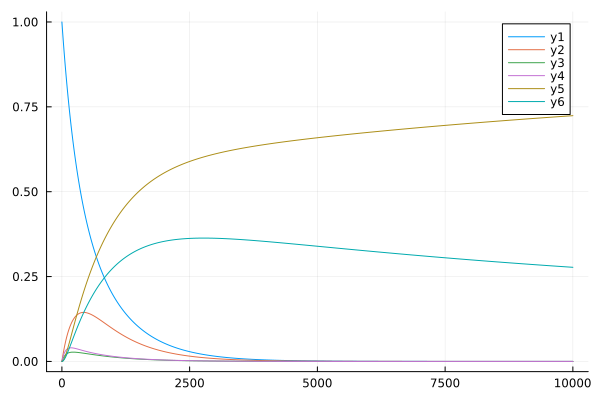

In [7]:
#Code used to plot data generated from ODE method solving Marcus theory 
using Plots
y1=P_1_array
y2=P_2_array
y3=P_3_array
y4=P_4_array
y5=P_5_array
y6=P_6_array
plot(t, [y1, y2, y3, y4, y5, y6])